<a href="https://colab.research.google.com/github/Erin-Xinying-Li/t81_558_deep_learning/blob/master/Expanded_EL.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [0]:
import warnings
import operator
warnings.filterwarnings('ignore')
from datetime import datetime

import numpy as np                               # vectors and matrices
import pandas as pd                              # tables and data manipulations
import matplotlib.pyplot as plt                  # plots
import seaborn as sns                            # more plots

from dateutil.relativedelta import relativedelta # working with dates with style
from scipy.optimize import minimize              # for function minimization
from sklearn import metrics
from scipy.stats import zscore
import statsmodels.formula.api as smf            # statistics and econometrics
import statsmodels.tsa.api as smt
import statsmodels.api as sm
import scipy.stats as scs

from itertools import product                    # some useful functions
from tqdm import tqdm_notebook

import warnings                                  # `do not disturbe` mode
warnings.filterwarnings('ignore')

%matplotlib inline
#import common libs
import sys
import json
import os
from datetime import datetime, date, timedelta
import math

sns.set()

import xgboost as xgb
from xgboost import plot_importance, plot_tree
from sklearn.metrics import mean_squared_error, mean_absolute_error
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import OneHotEncoder

from sklearn.model_selection import TimeSeriesSplit
plt.style.use('fivethirtyeight')

In [0]:
#version of python
print(f"Python Version {sys.version}")

Python Version 3.6.8 (default, Oct  7 2019, 12:59:55) 
[GCC 8.3.0]


In [0]:
# read data online
from google.colab import drive
drive.mount('/content/drive')

Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/drive


In [0]:
!ls /content/drive/My\ Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/Data_We_are_using_cleaned


FrontLinePrice.Csv	 PromotionData.Csv  weather.Csv
PDCNCharacteristics.Csv  SalesHistory.Csv


In [0]:
!ls /content/drive/My\ Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/Data_to_explore_cleaned

ExpandedSalesHistory.Csv


# **Read Data**

In [0]:
# Load data
df_sh = pd.read_csv('/content/drive/My Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/Data_We_are_using_cleaned/SalesHistory.Csv')
# df_fcst = pd.read_csv('/content/drive/My Drive/Boeing_FL19_AB/High_Performer_Lima/Data_We_are_using_cleaned/FCST.Csv')
df_pdcnc = pd.read_csv('/content/drive/My Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/Data_We_are_using_cleaned/PDCNCharacteristics.Csv')
df_flp = pd.read_csv('/content/drive/My Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/Data_We_are_using_cleaned/FrontLinePrice.Csv')
df_pmd = pd.read_csv('/content/drive/My Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/Data_We_are_using_cleaned/PromotionData.Csv')
df_weather = pd.read_csv('/content/drive/My Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/Data_We_are_using_cleaned/weather.Csv')
df_expsh = pd.read_csv('/content/drive/My Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/Data_to_explore_cleaned/ExpandedSalesHistory.Csv')



In [0]:
display(df_sh.head(),df_expsh.head())

,WSLR,PDCN,Week,Sales,holiday
0,80465,11BHHA2,27DEC2010:00:00:00.000,56,NaN
1,80465,11BHB20,27DEC2010:00:00:00.000,17,NaN
2,80465,11B9B40,27DEC2010:00:00:00.000,490,NaN
3,80465,11LP033,27DEC2010:00:00:00.000,39,NaN
4,80465,11T6389,27DEC2010:00:00:00.000,418,NaN


,WSLR_NBR,WSLR_ST_CD,WSLR_NM,PDCN_CD,BRND_NM,PDCN_NM,WSLR_CUST_NM,ADDR_LN_1_TXT,CITY_NM,ST_CD,ZIP_CD,Ethnicity,High_Level_Ethnic,Premise,Channel,Chain,CAL_DT,CURR_WK_MON_DT,SLS_QTY,SLS_CE,SLS_BE
0,80465,CA,80465 - ANHEUSER-BUSCH SALES OF LA CARSON CA,1153246,BUD LIGHT,BUD LIGHT 5 % 24/12 AL CAN 2/12 SP CF - 1153246,CVS PHARMACY #6705 - E3713,316 PCH,REDONDO BEACH,CA,90207,Gen-Predom White,Gen-Predom White,OFF,DRUG,CVS PHARMACIES,29OCT2014,27OCT2014,1.0,1.000000,0.072581
1,80465,CA,80465 - ANHEUSER-BUSCH SALES OF LA CARSON CA,11CHY55,CHELADA BUD LT,CHELADA BUD LT 5 % 15/25 AL CAN SRINK - 11CHY55,7-ELEVEN #16114-2173 - E8507,10834 SANTA MONICA BL,LOS ANGELES,CA,90025,Gen-Predom White,Gen-Predom White,OFF,CONVENIENCE,7-ELEVEN,21DEC2017,18DEC2017,1.0,1.302083,0.094506
2,80465,CA,80465 - ANHEUSER-BUSCH SALES OF LA CARSON CA,1103898,KIRIN ICHIBAN,KIRIN ICHIBAN 5 % 24/12 AL CAN 2/12 SP CF - 11...,PLA-BOY LIQUOR - E8906,6435 YUCCA ST,LOS ANGELES,CA,90028,Gen-Predom White,Gen-Predom White,OFF,PACKAGE LIQUOR,NaN,09MAR2016,07MAR2016,1.0,1.000000,0.072581
3,80465,CA,80465 - ANHEUSER-BUSCH SALES OF LA CARSON CA,11FYLT3,STELLA CIDRE,STELLA CIDRE 5 % 24/12 SALNNR 2/12 - 11FYLT3,RALPHS #284 - E2548,10772 W JEFFERSON BL,CULVER CITY,CA,90230,Gen-Predom White,Gen-Predom White,OFF,SUPERMKT/GROC,RALPHS,22NOV2017,20NOV2017,1.0,1.000000,0.072581
4,80465,CA,80465 - ANHEUSER-BUSCH SALES OF LA CARSON CA,11DWMP6,SHOCK TOP APPLE,SHOCK TOP APPLE 6 % 24/12 MRNR 4/6 ET BSKT - 1...,WALGREENS #07036 - E8800,5451 W SUNSET BL,LOS ANGELES,CA,90027,Gen-Predom White,Gen-Predom White,OFF,DRUG,WALGREENS,17APR2014,14APR2014,1.0,1.000000,0.072581


#Clean PDCNC TABLE

In [0]:
#select active pdcn and ordmethod of interest
useful_columns=['PDCN','Prod','Cont','Generic','BrandFamily','Brand','BrandCode','BrandGroup','Segment','Container','PkgDft','Type','OrdMethod','Active','Craft_Flag']
df_pdcnc = df_pdcnc.loc[:,useful_columns]
df_pdcnc = df_pdcnc.loc[(df_pdcnc.Active=='Y')&(df_pdcnc.OrdMethod=='F'),:]
#select only columns that are being used
 #Prod,'BrandCode, and Brand is the same
# Cont and container is the same
# Segment and BrandGroup is the same
df_pdcnc.drop(columns=['OrdMethod','Active','BrandCode','Cont','Container','BrandGroup','Prod','Generic','BrandFamily', 'PkgDft','Type'],inplace=True)
df_pdcnc["Craft_Flag"]=df_pdcnc.Craft_Flag.apply(lambda x: 1 if x=='Y' else 0)
df_pdcnc.head()

,PDCN,Brand,Segment,Craft_Flag
0,1000940,FP HOUSE LAGER,SuperPremium,1
27,10089B1,BP HAZY BASTARD,SuperPremium,1
28,10089B6,BP HAZY BASTARD,SuperPremium,1
29,1008BPA,BP HAZY BASTARD,SuperPremium,1
432,101R940,DB MILE 842,SuperPremium,1


# Clean Expanded History

In [0]:
# df_expsh.columns

Index(['WSLR_NBR', 'WSLR_ST_CD', 'WSLR_NM', 'PDCN_CD', 'BRND_NM', 'PDCN_NM',
       'WSLR_CUST_NM', 'ADDR_LN_1_TXT', 'CITY_NM', 'ST_CD', 'ZIP_CD',
       'Ethnicity', 'High_Level_Ethnic', 'Premise', 'Channel', 'Chain',
       'CAL_DT', 'CURR_WK_MON_DT', 'SLS_QTY', 'SLS_CE', 'SLS_BE'],
      dtype='object')

In [0]:
# df_expsh.CURR_WK_MON_DT.nunique() #301
# df_expsh.groupby('PDCN_CD').CURR_WK_MON_DT.nunique()

In [0]:
columns_used_in_expanded=['WSLR_NBR','PDCN_CD','ZIP_CD','Premise','Chain','CURR_WK_MON_DT', 'SLS_QTY']
df_expsh = df_expsh.loc[:,columns_used_in_expanded]
df_expsh['CURR_WK_MON_DT']=df_expsh['CURR_WK_MON_DT'].apply(lambda x: datetime.strptime(x,'%d%b%Y'))
df_expsh.rename({'WSLR_NBR':'WSLR','PDCN_CD':'PDCN','CURR_WK_MON_DT':'Week','SLS_QTY':'Sales'},axis=1,inplace=True)
df_expsh["Chain"]=df_expsh.Chain.fillna(0)
df_expsh["Chain"]=df_expsh.Chain.apply(lambda x: 1 if x !=0 else 0)
df_expsh["Premise"]=df_expsh.Premise.apply(lambda x: 0 if x != 'OFF' else 1)
df_expsh.head()

,WSLR,PDCN,ZIP_CD,Premise,Chain,Week,Sales
0,80465,1153246,90207,1,1,2014-10-27,1.0
1,80465,11CHY55,90025,1,1,2017-12-18,1.0
2,80465,1103898,90028,1,0,2016-03-07,1.0
3,80465,11FYLT3,90230,1,1,2017-11-20,1.0
4,80465,11DWMP6,90027,1,1,2014-04-14,1.0





## Seperate 90058 and the rest of wholesalers by creating binary dummy variable

In [0]:
# df_csv=df_expsh.groupby(['PDCN','ZIP_CD','Week','Premise','Chain']).Sales.sum()
# # df_csv=df_expsh.drop_duplicates(keep="last")
# df_csv.to_csv('/content/drive/My Drive/Boeing_FL19_AB/data.Csv')
# df_la = df_expsh.loc[df_expsh["ZIP_CD"]==90058,:] 
# df_expsh = df_expsh.loc[df_expsh["ZIP_CD"]!=90058,:]
df_expsh["binary_90058"]=df_expsh["ZIP_CD"].apply(lambda x: 1 if x==90058 else 0)

In [0]:
df_expsh.binary_90058.value_counts()

0    8669236
1        210
Name: binary_90058, dtype: int64

In [0]:
df_expsh.drop(columns=['ZIP_CD','WSLR'],inplace=True)

In [0]:
df_expsh.head()

,PDCN,Premise,Chain,Week,Sales,binary_90058
0,1153246,1,1,2014-10-27,1.0,0
1,11CHY55,1,1,2017-12-18,1.0,0
2,1103898,1,0,2016-03-07,1.0,0
3,11FYLT3,1,1,2017-11-20,1.0,0
4,11DWMP6,1,1,2014-04-14,1.0,0


In [0]:
df_expsh.shape

(8669446, 6)

In [0]:
df_expsh['Sales']=df_expsh.groupby(['PDCN','Week']).Sales.transform(lambda x:x.sum())
df_expsh_cleaned=df_expsh.drop_duplicates(keep="last") #assume other features for the same products are stable over time
df_expsh_cleaned.shape

(315078, 6)

In [0]:
#add holiday info
df_sh['Week']= pd.to_datetime(df_sh['Week'], format='%d%b%Y:%H:%M:%S.%f')
df_wk_holiday=df_sh[['Week','holiday']].drop_duplicates().reset_index(drop = True)
df_wk_holiday

,Week,holiday
0,2010-12-27,NaN
1,2011-01-03,NaN
2,2011-01-10,NaN
3,2011-01-17,NaN
4,2011-01-24,NaN
...,...,...
452,2019-08-26,Week before Labor Day
453,2019-09-02,Labor Day
454,2019-09-09,Week After Labor Day
455,2019-09-16,Two Weeks After Labor Day


In [0]:
df_expsh_cleaned=pd.merge(df_expsh_cleaned,df_wk_holiday,how='left',on='Week')
df_expsh_cleaned.info()

<class 'pandas.core.frame.DataFrame'>
Int64Index: 315078 entries, 0 to 315077
Data columns (total 7 columns):
PDCN            315078 non-null object
Premise         315078 non-null int64
Chain           315078 non-null int64
Week            315078 non-null datetime64[ns]
Sales           315078 non-null float64
binary_90058    315078 non-null int64
holiday         95087 non-null object
dtypes: datetime64[ns](1), float64(1), int64(3), object(2)
memory usage: 19.2+ MB


# Clean other tables 

In [0]:
df_weather = df_weather.fillna(method='bfill')
df_pmd['week']= pd.to_datetime(df_pmd['week'])
df_flp['week']= pd.to_datetime(df_flp['week'])
df_weather['Week']= pd.to_datetime(df_weather['Week'])


In [0]:
display(df_expsh_cleaned.head()), display(df_pdcnc.head()), display(df_flp.head()), display(df_pmd.head()), display(df_weather.head())

,PDCN,Premise,Chain,Week,Sales,binary_90058,holiday
0,99U1E82,1,0,2014-07-07,1.0,0,Week After July 4th
1,1179246,0,1,2018-07-02,158.0,0,July 4th
2,118W970,1,0,2014-11-03,103.0,0,NaN
3,119FL86,1,0,2014-09-29,7.0,0,NaN
4,99U3E44,1,1,2014-06-09,0.0,0,Two Weeks After Memorial Day


,PDCN,Prod,Cont,Generic,ProductClass,HighBrandFamily,BrandFamily,Brand,BrandCode,BrandGroup,Segment,Import_Category,Container,Line,PkgDft,Type,Material,Size,UOM,Size_Desc,Graphic,AlcPerc,PalletFct,LayerFct,BarrelFct,CaseFct,Weight,CaseUPC,UnitUPC,CarrierUPC,OrdMethod,Active,HE_Flag,Craft_Flag,MBProd,BrandClass,DumpCost
0,1000940,1000,940,NaN,99,AB BRANDS,FOUR PEAKS - BEER,FP HOUSE LAGER,FHH,WAMP1,SuperPremium,NaN,1/2 BARREL SV,51,D,DFT,ST,0.50000,BBL,1/2 BBL,NaN,6.1,4.0,4.0,0.500000,6.888889,161.095476,NaN,8.153510e+11,NaN,F,Y,Y,Y,Y,NaN,NaN
1,1000970,1000,970,NaN,99,AB BRANDS,FOUR PEAKS - BEER,FP HOUSE LAGER,FHH,WAMP1,SuperPremium,NaN,1/6 BARREL SV,49,D,DFT,ST,0.16667,BBL,1/6 BBL,NaN,6.1,12.0,12.0,0.166670,2.296342,57.328047,NaN,8.153510e+11,NaN,B,Y,Y,Y,Y,NaN,NaN
2,1000U24,1000,U24,NaN,99,AB BRANDS,FOUR PEAKS - BEER,FP HOUSE LAGER,FHH,WAMP1,SuperPremium,NaN,24/12 AL CAN SP,29,P,CAN,AL,12.00000,OZ,12 OZ,NaN,6.1,63.0,9.0,0.072581,1.000000,20.250000,NaN,NaN,NaN,B,Y,Y,Y,N,NaN,NaN
3,1001940,1001,940,NaN,98,AB BRANDS,DEVILS BACKBONE - BEER,DB SHROOMBOCK,DSH,WAMP1,SuperPremium,NaN,1/2 BARREL SV,51,D,DFT,ST,0.50000,BBL,1/2 BBL,NaN,7.4,4.0,4.0,0.500000,6.888889,161.095476,NaN,NaN,NaN,B,Y,Y,Y,Y,NaN,NaN
4,1001970,1001,970,NaN,98,AB BRANDS,DEVILS BACKBONE - BEER,DB SHROOMBOCK,DSH,WAMP1,SuperPremium,NaN,1/6 BARREL SV,49,D,DFT,ST,0.16667,BBL,1/6 BBL,NaN,7.4,12.0,12.0,0.166670,2.296342,57.328047,NaN,NaN,NaN,B,Y,Y,Y,Y,NaN,NaN


,WSLR,PDCN,Week,RECO_PTR
0,80465,1007917,2017-09-25,72.0
1,80465,1007917,2017-10-02,72.0
2,80465,1007917,2017-10-09,72.0
3,80465,1007917,2017-10-16,72.0
4,80465,1007917,2017-10-23,72.0


,WSLR,PDCN,Week,maxDiscount,avergeDisc,frontlinePrice
0,80465,1007940,2017-09-25,31.0,31.0,NaN
1,80465,1007940,2017-10-09,31.0,31.0,NaN
2,80465,1007940,2017-10-23,31.0,31.0,NaN
3,80465,1007940,2017-11-06,31.0,31.0,NaN
4,80465,1007940,2017-11-20,31.0,31.0,NaN


,WSLR,Week,AvgTemp,AvgPRCP
0,80465,2009-12-28,64.260000,0.000000
1,80465,2010-01-04,61.834286,0.000000
2,80465,2010-01-11,60.176429,0.050989
3,80465,2010-01-18,52.648571,0.562410
4,80465,2010-01-25,55.537857,0.018979


(None, None, None, None, None)

In [0]:
#df_expsh_cleaned.to_csv("/content/drive/My Drive/Boeing_FL19_AB/to explore in Tableau.csv")
#zipcode = 90733

In [0]:
# rename column names to make sure every dataframe has the same column name
#print(df_sh.columns)
print(df_pdcnc.columns)

df_flp.rename({'week':'Week'}, axis=1, inplace=True)

print(df_flp.columns)

df_pmd.rename({'wslr':'WSLR','pdcn':'PDCN','week':'Week'}, axis=1, inplace=True)


print(df_pmd.columns)
print(df_weather.columns)
print(df_expsh_cleaned.columns)

Index(['PDCN', 'Brand', 'Segment', 'Craft_Flag'], dtype='object')
Index(['WSLR', 'PDCN', 'Week', 'RECO_PTR'], dtype='object')
Index(['WSLR', 'PDCN', 'Week', 'maxDiscount', 'avergeDisc', 'frontlinePrice'], dtype='object')
Index(['WSLR', 'Week', 'AvgTemp', 'AvgPRCP'], dtype='object')
Index(['PDCN', 'Premise', 'Chain', 'Week', 'Sales', 'binary_90058', 'holiday'], dtype='object')


In [0]:
# merge to one master sheet
df_master=pd.DataFrame()
df_master=pd.merge(df_expsh_cleaned,df_pdcnc,how='left',on='PDCN')
df_master=pd.merge(df_master,df_flp,how='left',on=['PDCN','Week'])
df_master=pd.merge(df_master,df_pmd,how='left',on=['WSLR','PDCN','Week'])
df_master=pd.merge(df_master,df_weather,how='left',on=['WSLR','Week'])
print(df_master.shape)



(315078, 17)


## XG Boosting handles missing values internally? moving average n/a, brand,segment, craft also missing

In [0]:
df_master.sort_values(by=['PDCN','Week'],inplace=True)
df_master.RECO_PTR.fillna(method='bfill',inplace=True)
df_master=df_master.fillna({'avergeDisc':0})
df_master=df_master.fillna({'maxDiscount':0})
df_master=df_master.fillna({'AvgPRCP':0})
df_master.drop(columns=['frontlinePrice','RECO_PTR'],inplace=True)
#drop no temp columns
df_master=df_master.loc[df_master["AvgTemp"].isna()==False,:]
for i in df_master.columns:
  print(i, df_master.loc[:,i].isna().sum())
#pdcnc table has 8 na segments

PDCN 0
Premise 0
Chain 0
Week 0
Sales 0
binary_90058 0
holiday 198162
Brand 71712
Segment 72697
Craft_Flag 71712
WSLR 0
maxDiscount 0
avergeDisc 0
AvgTemp 0
AvgPRCP 0


In [0]:
# df_master=df_master.loc[df_master["Segment"].isna()==False,:]
df_master.head()

,PDCN,Premise,Chain,Week,Sales,binary_90058,holiday,Brand,Segment,Craft_Flag,WSLR,maxDiscount,avergeDisc,AvgTemp,AvgPRCP
97388,1007917,0,0,2018-01-29,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,56.9,0.0
75277,1007917,0,0,2018-02-05,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,66.4,0.0
9165,1007917,0,0,2018-02-12,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,63.4,0.0
96345,1007917,0,1,2018-02-12,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,63.4,0.0
1621,1007917,0,0,2018-02-19,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,62.1,0.0


# **Feature Engineering**

In [0]:
#Create Date Feature
def create_features(df):
    """
    Creates time series features from datetime index
    """
    df['date'] = df["Week"]
    # df['hour'] = df['date'].dt.hour
    # df['dayofweek'] = df['date'].dt.dayofweek
    df['quarter'] = df['date'].dt.quarter
    df['month'] = df['date'].dt.month
    df['year'] = df['date'].dt.year
    df['dayofyear'] = df['date'].dt.dayofyear
    df['dayofmonth'] = df['date'].dt.day
    df['weekofyear'] = df['date'].dt.weekofyear
    df.drop('date',axis=1,inplace=True)
    # return df

In [0]:
create_features(df_master)


In [0]:
df_master.head()

,PDCN,Premise,Chain,Week,Sales,binary_90058,holiday,Brand,Segment,Craft_Flag,WSLR,maxDiscount,avergeDisc,AvgTemp,AvgPRCP,quarter,month,year,dayofyear,dayofmonth,weekofyear
97388,1007917,0,0,2018-01-29,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,56.9,0.0,1,1,2018,29,29,5
75277,1007917,0,0,2018-02-05,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,66.4,0.0,1,2,2018,36,5,6
9165,1007917,0,0,2018-02-12,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,63.4,0.0,1,2,2018,43,12,7
96345,1007917,0,1,2018-02-12,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,63.4,0.0,1,2,2018,43,12,7
1621,1007917,0,0,2018-02-19,2.0,0,NaN,NaN,NaN,NaN,80465.0,0.0,0.0,62.1,0.0,1,2,2018,50,19,8


To get sales features

In [0]:
df_month_sales=pd.DataFrame()
df_month_sales=df_master.groupby(['PDCN','month','year'])['Sales'].mean().reset_index()
df_month_sales.rename(columns={'Sales':"month_avg_sales"},inplace=True)
# df_month_sales.head()
df_used_master=pd.merge(df_master,df_month_sales,how='left',on=['PDCN','month','year'])
# df_used_master.head()
# df_used_master.shape

In [0]:
def sales_moving_average_wk(df,windows):
  df['sma_wk_'+str(windows)]=df.iloc[:,df.columns.get_loc("Sales")].rolling(window=windows).mean()
  return df
def sales_moving_median_wk(df,windows):
  df['smd_wk_'+str(windows)]=df.iloc[:,df.columns.get_loc("Sales")].rolling(window=windows).median()
  return df
def sales_moving_average_mt(df,windows):
  df['sma_mt_'+str(windows)]=df.iloc[:,df.columns.get_loc("month_avg_sales")].rolling(window=windows).mean()
  return df
def sales_moving_median_mt(df,windows):
  df['smd_mt_'+str(windows)]=df.iloc[:,df.columns.get_loc("month_avg_sales")].rolling(window=windows).median()
  return df

In [0]:
for i in range(2,13):
  sales_moving_average_wk(df_used_master,i)
for i in range(2,13):
  sales_moving_median_wk(df_used_master,i)
for i in range(2,13):
  sales_moving_average_mt(df_used_master,i)
for i in range(2,13):
  sales_moving_median_mt(df_used_master,i) 


In [0]:
meta = pd.DataFrame(df_used_master.dtypes,columns=["type"])
cat_var= meta.index[meta["type"]=="object"].tolist()
cat_var.remove('PDCN')
print(cat_var)
numeric_var_to_encode=['maxDiscount', 'avergeDisc', 'AvgTemp', 'AvgPRCP'] #sales related variables are in the same unit as y so don't need to be encoded


['holiday', 'Brand', 'Segment']


In [0]:
for cat in cat_var:
  dummies = pd.get_dummies(df_used_master[cat],prefix=cat) 
  df_used_master = pd.concat([df_used_master,dummies],axis=1)
  df_used_master.drop(cat,axis=1,inplace=True)

for num in numeric_var_to_encode:
  df_used_master[num]=zscore(df_used_master[num])
df_used_master.head()

,PDCN,Premise,Chain,Week,Sales,binary_90058,Craft_Flag,WSLR,maxDiscount,avergeDisc,AvgTemp,AvgPRCP,quarter,month,year,dayofyear,dayofmonth,weekofyear,month_avg_sales,sma_wk_2,sma_wk_3,sma_wk_4,sma_wk_5,sma_wk_6,sma_wk_7,sma_wk_8,sma_wk_9,sma_wk_10,sma_wk_11,sma_wk_12,smd_wk_2,smd_wk_3,smd_wk_4,smd_wk_5,smd_wk_6,smd_wk_7,smd_wk_8,smd_wk_9,smd_wk_10,smd_wk_11,...,Brand_SELECT,Brand_SELECT 55,Brand_SHOCK TOP ALE,Brand_SHOCK TOP LEMON,Brand_SHOCK TOP PRETZ,Brand_SHOCK TOP RBYFR,Brand_SHOCK TOP SM VR,Brand_SHOCK TOP SP VR,Brand_SHOCK TOP WN SM,Brand_SPATEN LAGER,Brand_SPATEN OKTRFEST,Brand_SPATEN OPTIMATR,Brand_SS INDRIVGRAPFR,Brand_ST PAULI LAGER,Brand_ST PAULI NA,Brand_STELLA ARTOIS,Brand_STELLA CIDRE,Brand_STELLA SPRITZER,Brand_STRAWBERITA,Brand_TEABLOOD ORANGE,Brand_TEAVBBLIME,Brand_TEAVMANGOBLACK,Brand_TEAVMEYERLEM,Brand_TEAVPASSION TAN,Brand_TEAVPEACHGREEN,Brand_TEAVPEANECHGREE,Brand_TEAVPINEBLUE,Brand_TEAVSTRAWAPPLE,Brand_TEAVVARIETY,Brand_WATERMELON RITA,Segment_CBA Brands,Segment_Core,Segment_CorePlus,Segment_FMB,Segment_Hiball Family,Segment_NonAlc,Segment_Premium,Segment_SuperPremium,Segment_Teavana Brands,Segment_Value
0,1007917,0,0,2018-01-29,2.0,0,NaN,80465.0,-0.550466,-0.558761,-1.427419,-0.204552,1,1,2018,29,29,5,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
1,1007917,0,0,2018-02-05,2.0,0,NaN,80465.0,-0.550466,-0.558761,-0.164374,-0.204552,1,2,2018,36,5,6,1.8,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
2,1007917,0,0,2018-02-12,2.0,0,NaN,80465.0,-0.550466,-0.558761,-0.563230,-0.204552,1,2,2018,43,12,7,1.8,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
3,1007917,0,1,2018-02-12,2.0,0,NaN,80465.0,-0.550466,-0.558761,-0.563230,-0.204552,1,2,2018,43,12,7,1.8,2.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
4,1007917,0,0,2018-02-19,2.0,0,NaN,80465.0,-0.550466,-0.558761,-0.736068,-0.204552,1,2,2018,50,19,8,1.8,2.0,2.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,NaN,2.0,2.0,2.0,2.0,NaN,NaN,NaN,NaN,NaN,NaN,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


In [0]:
df_master.shape

(284973, 21)

# Train Test Split

In [0]:
df_used_master.sort_values(by=['Week'],inplace=True)
df_used_master.set_index('PDCN',inplace=True)


In [0]:
df_used_master.isna().sum().sum()

71976

## Split data to train, eval, and test

#### remove WSLR,exact date



In [0]:
# df_used_master.set_index('PDCN',inplace=True)
# df_used_master.drop('Week',axis=1,inplace=True)
Y =df_used_master.Sales.values
X = df_used_master.drop(['Sales','Week','WSLR'],axis=1)

# df_used_master.head()

In [0]:
# train_size = int(len(X) * 0.8)
# X_train, X_test = X[0:train_size], X[train_size:len(X)]
# Y_train, Y_test = Y[0:train_size], Y[train_size:len(X)]

train_size = int(len(X) * 0.6)
eval_size = int(len(X) * 0.2)
X_train, X_eval,X_test = X[0:train_size], X[train_size:(train_size+eval_size)],X[(train_size+eval_size):len(X)]
Y_train,Y_eval, Y_test = Y[0:train_size], Y[train_size:(train_size+eval_size)],Y[(train_size+eval_size):len(X)]
df_test=df_used_master.reset_index().loc[(train_size+eval_size):len(X),]
df_test.head()

,PDCN,Premise,Chain,Week,Sales,binary_90058,Craft_Flag,WSLR,maxDiscount,avergeDisc,AvgTemp,AvgPRCP,quarter,month,year,dayofyear,dayofmonth,weekofyear,month_avg_sales,sma_wk_2,sma_wk_3,sma_wk_4,sma_wk_5,sma_wk_6,sma_wk_7,sma_wk_8,sma_wk_9,sma_wk_10,sma_wk_11,sma_wk_12,smd_wk_2,smd_wk_3,smd_wk_4,smd_wk_5,smd_wk_6,smd_wk_7,smd_wk_8,smd_wk_9,smd_wk_10,smd_wk_11,...,Brand_SELECT,Brand_SELECT 55,Brand_SHOCK TOP ALE,Brand_SHOCK TOP LEMON,Brand_SHOCK TOP PRETZ,Brand_SHOCK TOP RBYFR,Brand_SHOCK TOP SM VR,Brand_SHOCK TOP SP VR,Brand_SHOCK TOP WN SM,Brand_SPATEN LAGER,Brand_SPATEN OKTRFEST,Brand_SPATEN OPTIMATR,Brand_SS INDRIVGRAPFR,Brand_ST PAULI LAGER,Brand_ST PAULI NA,Brand_STELLA ARTOIS,Brand_STELLA CIDRE,Brand_STELLA SPRITZER,Brand_STRAWBERITA,Brand_TEABLOOD ORANGE,Brand_TEAVBBLIME,Brand_TEAVMANGOBLACK,Brand_TEAVMEYERLEM,Brand_TEAVPASSION TAN,Brand_TEAVPEACHGREEN,Brand_TEAVPEANECHGREE,Brand_TEAVPINEBLUE,Brand_TEAVSTRAWAPPLE,Brand_TEAVVARIETY,Brand_WATERMELON RITA,Segment_CBA Brands,Segment_Core,Segment_CorePlus,Segment_FMB,Segment_Hiball Family,Segment_NonAlc,Segment_Premium,Segment_SuperPremium,Segment_Teavana Brands,Segment_Value
227977,1146940,0,0,2018-09-24,28.0,0,1.0,80465.0,-0.550466,-0.558761,0.846063,-0.204552,3,9,2018,267,24,39,18.300000,24.0,22.666667,22.00,20.6,19.666667,19.000000,18.000,17.222222,17.4,17.545455,17.750000,24.0,20.0,20.0,20.0,20.0,20.0,17.5,15.0,17.0,19.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
227978,1146940,0,1,2018-09-24,28.0,0,1.0,80465.0,-0.550466,-0.558761,0.846063,-0.204552,3,9,2018,267,24,39,18.300000,28.0,25.333333,24.00,23.2,21.833333,20.857143,20.125,19.111111,18.3,18.363636,18.416667,28.0,28.0,24.0,20.0,20.0,20.0,20.0,20.0,17.5,19.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
227979,11Q7Y51,1,1,2018-09-24,3.0,0,NaN,80465.0,-0.240380,-0.242631,0.846063,-0.204552,3,9,2018,267,24,39,3.666667,3.5,3.666667,3.75,3.8,3.833333,3.857143,3.750,3.444444,4.1,3.909091,4.250000,3.5,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,4.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
227980,111O5HB,1,1,2018-09-24,2.0,0,0.0,80465.0,-0.550466,-0.558761,0.846063,-0.204552,3,9,2018,267,24,39,2.333333,2.0,2.333333,2.50,2.2,1.833333,1.857143,1.750,2.000000,2.2,2.272727,2.750000,2.0,2.0,2.5,2.0,2.0,2.0,2.0,2.0,2.0,2.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
227981,11Q7Y51,1,0,2018-09-24,3.0,0,NaN,80465.0,-0.240380,-0.242631,0.846063,-0.204552,3,9,2018,267,24,39,3.666667,3.0,3.333333,3.50,3.6,3.666667,3.714286,3.750,3.666667,3.4,4.000000,3.833333,3.0,3.0,3.5,4.0,4.0,4.0,4.0,4.0,4.0,4.0,...,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0


### Hyper Tuning
## run after base model

In [0]:
RS = 100
ROUNDS = 500
# def time_series_split(X,Y):
#   # submission=time.time()
#   tscv = TimeSeriesSplit(n_splits=5)
#   for train_index, test_index in tscv.split(X):
#     x1, X_val = X[:len(train_index)], X[len(train_index): (len(train_index)+len(test_index))]
#     y1, y_val = Y[:len(train_index)], Y[len(train_index): (len(train_index)+len(test_index))]
#   return x1, X_val, y1, y_val

def xgb_evaluate(eta,max_depth):
  hyper_time = time.time()
  params = {}
  params['objective'] = 'reg:squarederror'
  params['eval_metric'] = 'rmse'
  params['eta'] = eta
  params['max_depth'] = int(max_depth)
  params['silent'] = 1
  params['seed'] = RS

	# x1, X_val, y1, y_val = train_test_split(x_train, y_train, test_size=0.25, random_state=RS)
  # time_series_split(X_train,Y_train)
  tscv = TimeSeriesSplit(n_splits=5)
  for train_index, test_index in tscv.split(X_train):
    x1, X_val = X_train[:len(train_index)], X_train[len(train_index): (len(train_index)+len(test_index))]
    y1, y_val = Y_train[:len(train_index)], Y_train[len(train_index): (len(train_index)+len(test_index))]
    xg_train = xgb.DMatrix(x1, label=y1)
    cv_result = xgb.cv(params, xg_train, num_boost_round=1000)
    print("--- %s seconds ---" % (time.time() - hyper_time))
    return -1.0 * cv_result['test-rmse-mean'].iloc[-1]

In [0]:
# import time
# tune_start_time = time.time()
# xgb_bo = BayesianOptimization(xgb_evaluate, {'eta':(0.01,0.3),'max_depth': (3,12)})
# print(xgb_bo)
# xgb_bo.maximize(init_points=5, n_iter=8, acq='ei')

# print("Params before:", params)
# print(xgb_bo)

# params = xgb_bo.max['params']
# params['max_depth'] = int(params['max_depth'])

# params['objective'] = 'reg:squarederror'
# params['eval_metric'] = 'rmse'
# params['silent'] = 1
# params['seed'] = RS

# print("Params after:", params)

# print("--- %s seconds for tuning---" % (time.time() - tune_start_time))

# **Train Model and Output Result**

In [0]:
input_folder='/content/drive/My Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/'

Training data: X_train: (170983, 344), Y_train: 170983, X_test: (56996, 344)
Will train XGB for 500 rounds, RandomSeed: 100
[0]	train-rmse:864.427	eval-rmse:688.348
[1]	train-rmse:729.133	eval-rmse:581.013
[2]	train-rmse:614.912	eval-rmse:489.96
[3]	train-rmse:519.673	eval-rmse:415.121
[4]	train-rmse:438.779	eval-rmse:351.575
[5]	train-rmse:370.743	eval-rmse:298.045
[6]	train-rmse:313.505	eval-rmse:252.832
[7]	train-rmse:265.526	eval-rmse:215.333
[8]	train-rmse:224.866	eval-rmse:184.117
[9]	train-rmse:190.7	eval-rmse:157.746
[10]	train-rmse:162.138	eval-rmse:136.368
[11]	train-rmse:138.12	eval-rmse:118.059
[12]	train-rmse:117.953	eval-rmse:103.04
[13]	train-rmse:100.978	eval-rmse:90.6161
[14]	train-rmse:86.6957	eval-rmse:80.3478
[15]	train-rmse:74.6874	eval-rmse:71.6052
[16]	train-rmse:64.5256	eval-rmse:64.8028
[17]	train-rmse:56.0793	eval-rmse:59.396
[18]	train-rmse:48.9815	eval-rmse:55.0436
[19]	train-rmse:43.0801	eval-rmse:51.6396
[20]	train-rmse:38.1583	eval-rmse:48.7575
[21]	train

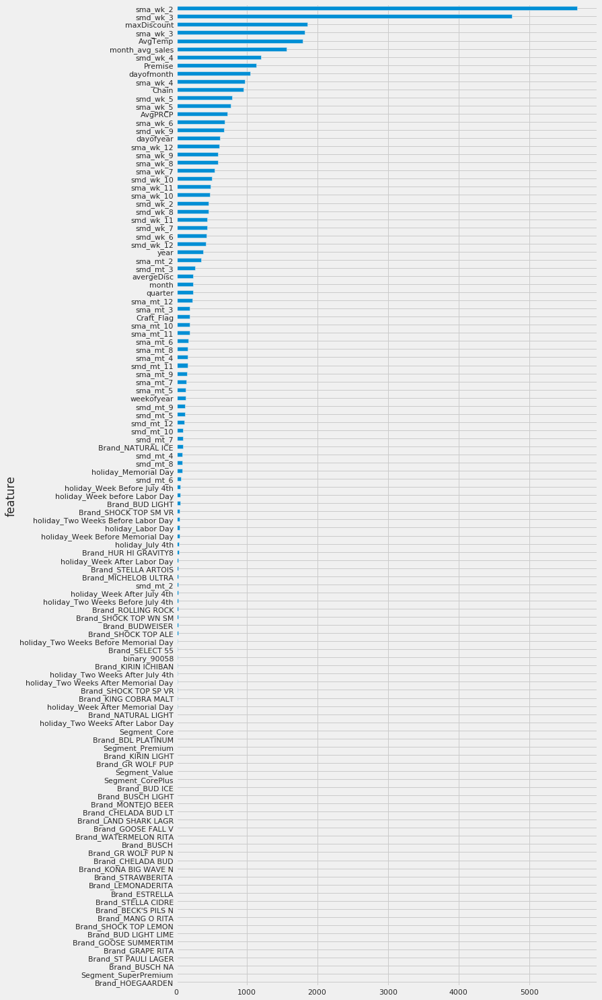

In [0]:
import time
RS=100
ROUNDS=500
submission=time.time()
from xgboost import plot_importance

def train_xgb(X_train, Y_train,X_eval,Y_eval, params):
	print("Will train XGB for {} rounds, RandomSeed: {}".format(ROUNDS, RS))
	# x, X_val, y_train, y_val = train_test_split(X, y, test_size=0.2, random_state=RS)

	xg_train = xgb.DMatrix(X_train, label=Y_train)
	xg_val = xgb.DMatrix(X_eval, label=Y_eval)

	watchlist  = [(xg_train,'train'), (xg_val,'eval')]
	return xgb.train(params, xg_train, ROUNDS, watchlist)

def predict_xgb(clr, X_test):
	return clr.predict(xgb.DMatrix(X_test))
 

# def create_feature_map(features):
# 	outfile = open('xgb.fmap', 'w')
# 	i = 0
# 	for feat in features:
# 		outfile.write('{0}\t{1}\tq\n'.format(i, feat))
# 		i = i + 1
# 	outfile.close()
def create_feature_map(features):
    outfile = open('xgb.fmap', 'w')
    for i, feat in enumerate(features):
        outfile.write('{0}\t{1}\tq\n'.format(i, feat))
    outfile.close()


# params = {}
# params['objective'] = 'reg:squarederror'
# params['eval_metric'] = 'rmse'
# # params['eta'] = 0.1939 #dummy
# # params['max_depth'] = 5 #dummy
# params['eta'] = 0.2
# params['max_depth'] = 6
# params['silent'] = 1
# params['seed'] = RS

# Baseline Params:
params = {}
params['objective'] = 'reg:squarederror'
params['eval_metric'] = 'rmse'
# params['eta'] = 0.1939 #dummy
# params['max_depth'] = 5 #dummy
params['eta'] = 0.16076479919165962
params['max_depth'] = 7
params['subsample']=0.9 #the fraction of observations to be randomly samples for each tree.
params['colsample_bytree']=0.9 #the fraction of columns to be randomly samples for each tree
params['seed'] = RS

#x_train
# x=df_used_master.drop(['Sales','Week'],axis=1)


print("Training data: X_train: {}, Y_train: {}, X_test: {}".format(X_train.shape, len(Y_train), X_test.shape))
clr = train_xgb(X_train, Y_train,X_eval,Y_eval, params)
preds = predict_xgb(clr, X_test)

# print("Writing output...")
# sub = pd.DataFrame()
# sub['PDCN'] = df_test['PDCN']
# sub['Week']= df_test['Week']
# sub['pred_sales'] = preds
# sub['real_sales']=df_test['Sales']
# sub.to_csv(input_folder + "xgb_seed{}_n{}_sb{}.csv".format(RS, ROUNDS,submission), index=False)

feature_names = list(X_train.columns.values)
create_feature_map(feature_names)
print("Features: {}".format(feature_names))

print("Features importances...")
importance=clr.get_score(importance_type='weight')
importance = sorted(importance.items(),key=operator.itemgetter(1))
ft = pd.DataFrame(importance, columns=['feature', 'weight'])

ft.plot(kind='barh', x='feature', y='weight', legend=False, figsize=(10, 25))
plt.gcf().savefig('features_importance.png')
	


print("Done.")

In [0]:
score = np.sqrt(metrics.mean_squared_error(preds,Y_test))
print(f"Final score (RMSE): {score}")

Final score (RMSE): 29.818310173878515


In [0]:
from math import sqrt
from sklearn.metrics import mean_absolute_error
from sklearn.metrics import accuracy_score
# y_pred = regressor.predict(X_test)
smse=sqrt(mean_squared_error(preds,Y_test))
mse=mean_squared_error(preds,Y_test)
mae=mean_absolute_error(preds,Y_test)
# acs=accuracy_score(preds,Y_test)
print("sqrt_mse: {}, mse: {}, mae: {}".format(smse, mse, mae))


sqrt_mse: 29.85827967030692, mse: 891.5168648702636, mae: 4.38935995686409


In [0]:
output_folder='/content/drive/My Drive/Boeing_FL19_AB/Lower_Performer_Los_Angeles/outputs/'
submission=time.time()
print("Writing output...")
sub = pd.DataFrame()
sub['PDCN'] = df_test['PDCN']
sub['Week']= df_test['Week']
sub['pred_sales'] = preds
sub['real_sales']=df_test['Sales']
sub['diff']=(sub['pred_sales']-sub['real_sales']).abs()
sub['%']=sub['diff']/sub['real_sales']
# sub=sub.replace(np.inf, np.nan).dropna()
sub=sub.replace(np.inf, 1)
print(1-sub['%'].mean())
# sub.to_csv(output_folder + "xgb_seed{}_n{}_sb{}.csv".format(RS, ROUNDS,submission), index=False)

# w_mape = mae/sub["real_sales"].mean()
# w_mape

Writing output...
0.8755896356910019


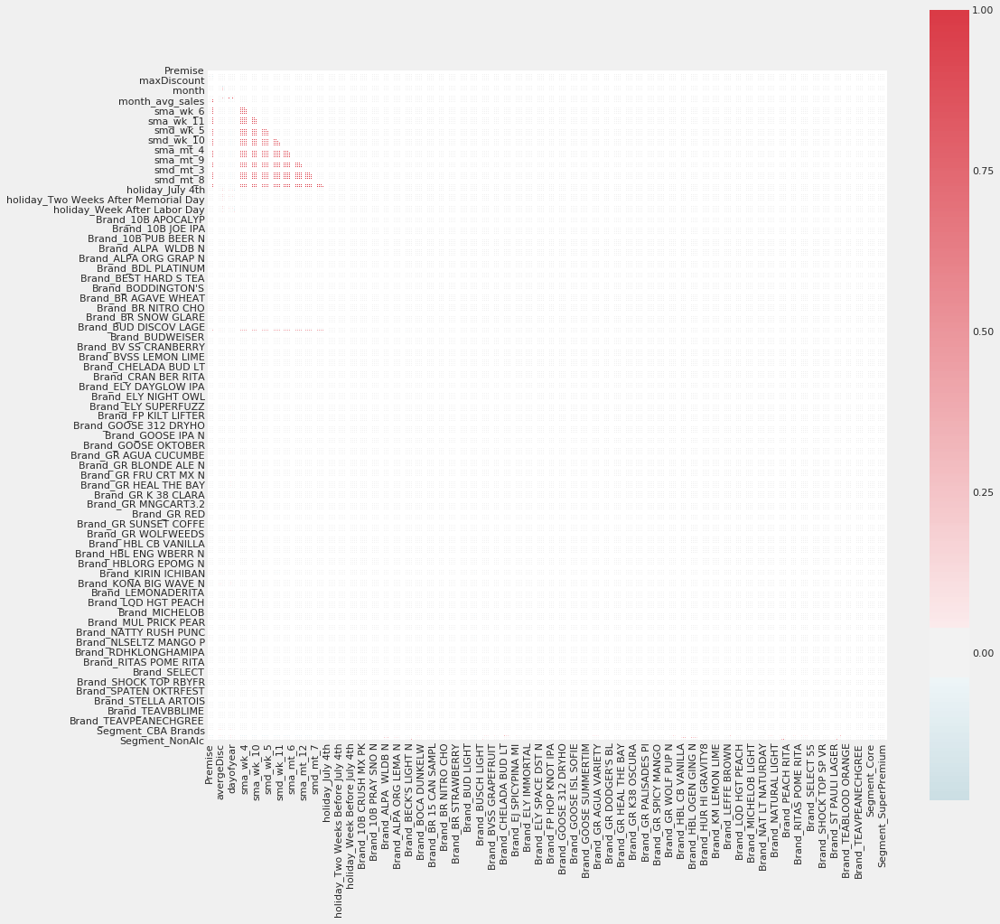

In [0]:
corr = df_used_master.corr()
mask = np.zeros_like(corr, dtype=np.bool)
mask[np.triu_indices_from(mask)] = True

f, ax = plt.subplots(figsize=(15, 15))
cmap = sns.diverging_palette(220, 10, as_cmap=True)

sns.heatmap(corr, mask=mask, cmap=cmap,
            center=0, square=True, linewidths = .5)
plt.show()

In [0]:
# Making the Confusion Matrix
from sklearn.metrics import confusion_matrix
cm = confusion_matrix(Y_test, preds)

In [0]:
# df_master_date=df_master_datefeature
# object_list=[]
# for i in df_master_date.columns:
#   if df_master_date[i].dtypes=='object':
#     object_list.append(i)
# object_list

# **Other Models**

In [0]:
from sklearn.linear_model import ElasticNet, Lasso,  BayesianRidge, LassoLarsIC
from sklearn.ensemble import RandomForestRegressor,  GradientBoostingRegressor
from sklearn.kernel_ridge import KernelRidge
from sklearn.pipeline import make_pipeline
from sklearn.preprocessing import RobustScaler
from sklearn.base import BaseEstimator, TransformerMixin, RegressorMixin, clone
from sklearn.model_selection import KFold, cross_val_score, train_test_split
from sklearn.metrics import mean_squared_error
import xgboost as xgb
import lightgbm as lgb

In [0]:
#Validation function
n_folds = 5

def rmsle_cv(model):
    kf = KFold(n_folds, shuffle=True, random_state=42).get_n_splits(train.values)
    rmse= np.sqrt(-cross_val_score(model, train.values, y_train, scoring="neg_mean_squared_error", cv = kf))
    return(rmse)

# **Data Visualization**

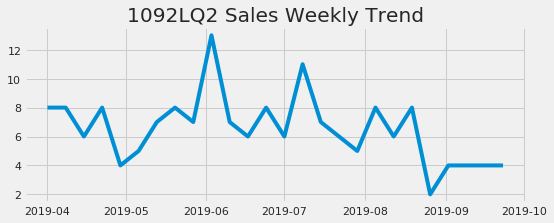

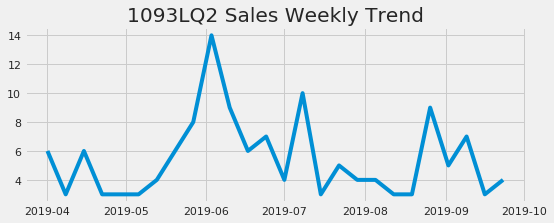

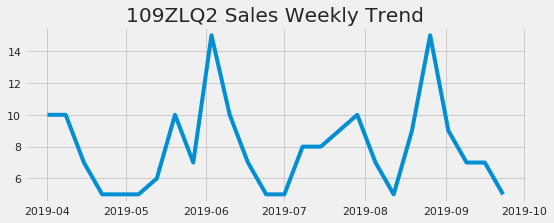

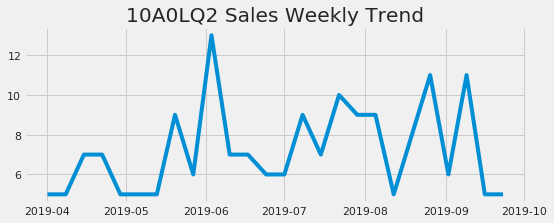

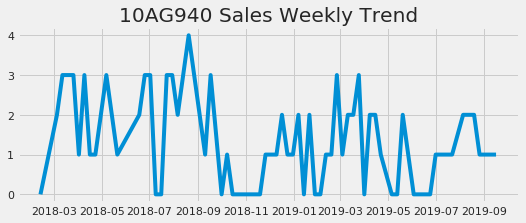

...

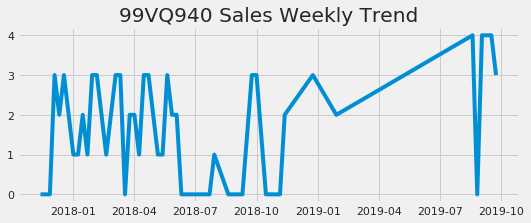

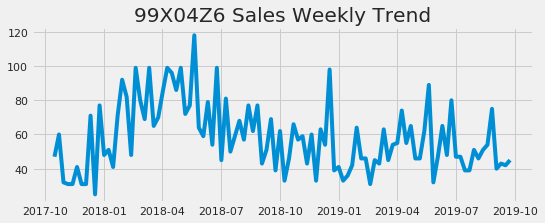

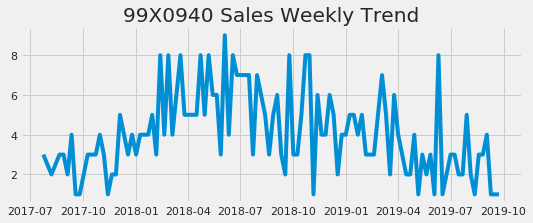

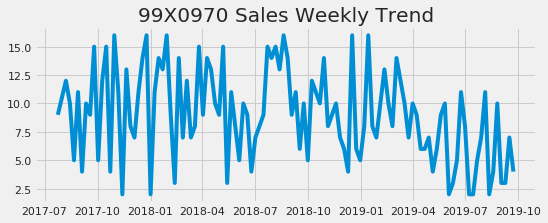

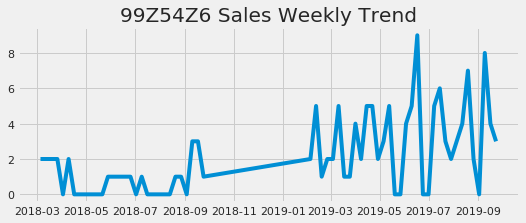

In [0]:
def plt_sales(df,i):
  plt.figure(figsize=(8, 3))
  plt.plot(df.Sales)
  plt.title(i+' Sales Weekly Trend')
  plt.grid(True)
  plt.show()

df_plt_pdcn=pd.DataFrame()
df_plt_pdcn=df_sh.groupby(['PDCN','Week'])['Sales'].sum().reset_index()
df_plt_pdcn=df_plt_pdcn.set_index('Week')
pdcn_l=list(df_plt_pdcn.PDCN.unique())

for i in pdcn_l:
  a=df_plt_pdcn.loc[df_plt_pdcn['PDCN']==i]
  plt_sales(a,i)


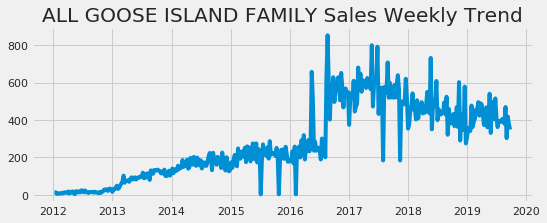

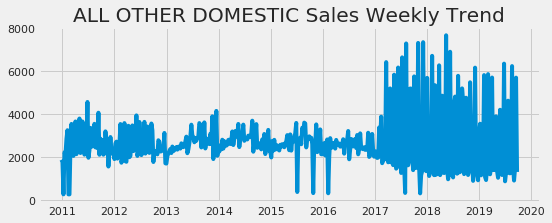

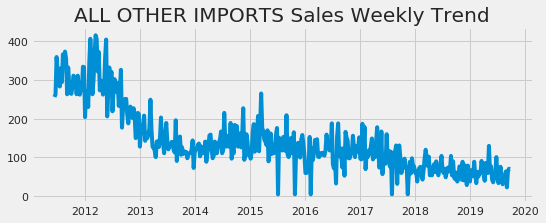

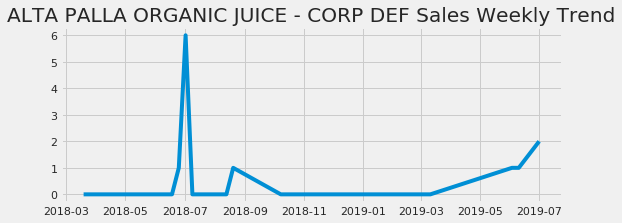

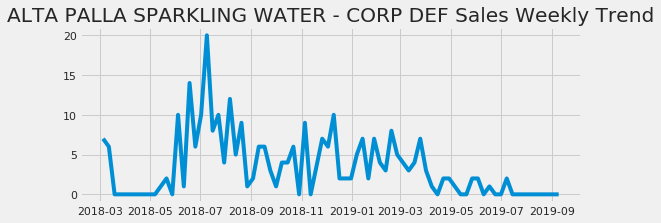

...

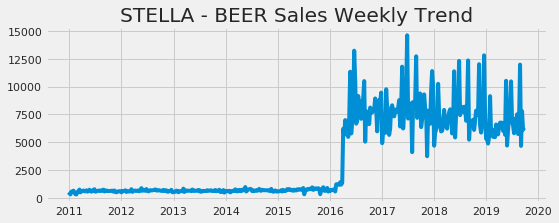

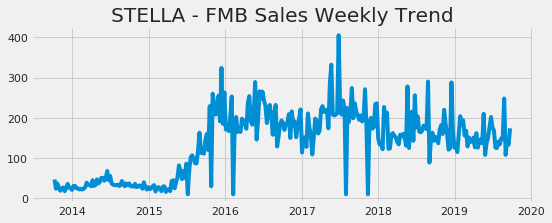

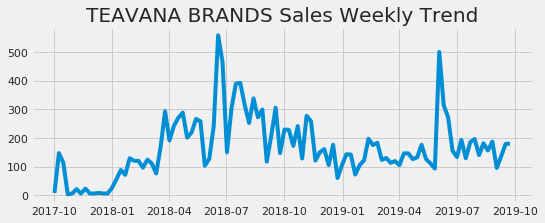

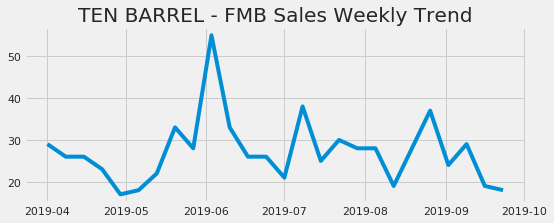

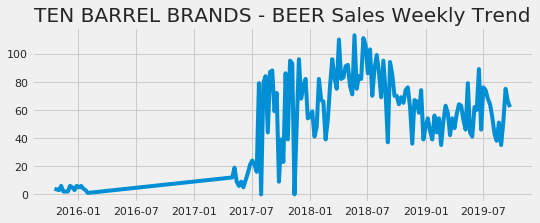

In [0]:
df_plt_brand=pd.DataFrame()
df_plt_brand=df_current_used.groupby(['BrandFamily','Week'])['Sales'].sum().reset_index()
df_plt_brand=df_plt_brand.set_index('Week')
brand_l=list(df_plt_brand.BrandFamily.unique())

for i in brand_l:
  b=df_plt_brand.loc[df_plt_brand['BrandFamily']==i]
  plt_sales(b,i)

In [0]:
df_master_date=df_master_datefeature
# df_master_date.drop('PDCN',axis=1,inplace=True)
# df_master_date.drop('Generic',axis=1,inplace=True)
# df_master_date.drop('Brand',axis=1,inplace=True)

object_list=[]
for i in df_master_date.columns:
  if df_master_date[i].dtypes=='object':
    object_list.append(i)
# one hot encoder categorical to dummy
for i in object_list: 
  encode_text_dummy(df_master_date,i)
df_features=df_master_date
df_features=df_features.fillna(0)
df_features.head()

In [0]:
# Pandas to Numpy
df_y=df_features['Sales']
df_x=df_features
df_x.drop(['WSLR','Week','Sales','date'], axis=1, inplace=True)
names = list(df_x.columns)
x = df_x.values
y = df_y.values 